# Comprehensive EDA: Microrobot Pose & Depth Estimation
---

**Objectives**
- Understand label distributions (pitch, roll, depth)
- Visualize pose manifolds using dimensionality reduction
- Analyze sharpness/focus relationship with depth
- Create pose atlas and depth-video visualizations

---

## Table of Contents

### **Setup**

### **Part 1: Data Loading**

### **Part 2: Label Distribution Analysis**

### **Part 3: Pose Atlas Visualization**

### **Part 4: Manifold Visualization**

### **Part 5: Sharpness/Focus Analysis**

### **Part 6: Animated Visualizations**
- 6.1 Depth Animation: Fixed Pose, Varying Depth
- 6.2 Pitch-Roll Animation: Fixed Depth, varying pose

## Setup and Imports

In [1]:
# Standard libraries
import os
import sys
import ast
from pathlib import Path
from collections import defaultdict, Counter
import warnings
warnings.filterwarnings('ignore')

# Data manipulation
import numpy as np
import pandas as pd

# Visualization
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from matplotlib.patches import Rectangle
import seaborn as sns

# Image processing
from PIL import Image, ImageOps
import cv2

# Dimensionality reduction
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
try:
    import umap
except ImportError:
    print("⚠️  UMAP not installed. Install with: pip install umap-learn")
    umap = None

# Animation
from IPython.display import Image as IPImage
import imageio

# Set visualization style
sns.set_style('whitegrid')
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['font.size'] = 10

# Add project root to path
project_root = Path(os.getcwd()).parent
sys.path.append(str(project_root))

print(" All libraries imported successfully")
print(f" Project root: {project_root}")

 All libraries imported successfully
 Project root: /Users/adgodoyo/Library/CloudStorage/OneDrive-UniversidadNacionaldeColombia/Textos y Trabajos/Academic Imperial/Deep Learning/Final Assignment/mycode


## Part 1: Data Loading

In [2]:
data_path = project_root / 'data'
data_records = []

for folder in sorted(data_path.iterdir()):
    if not folder.is_dir() or folder.name.startswith('.'):
        continue
    
    try:
        p_label, r_label = folder.name.split('_')
        pitch = int(p_label.replace('P', ''))
        roll = int(r_label.replace('R', ''))
    except ValueError:
        continue
    
    depth_file = folder / f"{folder.name}_depth.txt"
    if not depth_file.exists():
        continue
    
    with open(depth_file, 'r') as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            
            img_name, depth_value = ast.literal_eval(line)
            img_path = folder / img_name
            
            if img_path.exists():

                # FIX ROTATION + REMOVE EXIF (VERY IMPORTANT STEP)

                try:
                    img = Image.open(img_path)

                    # Apply the EXIF orientation to the pixels (this is the KEY step)
                    img_fixed = ImageOps.exif_transpose(img)

                    # Force removal of all metadata by recreating the image
                    img_clean = Image.new(img_fixed.mode, img_fixed.size)
                    img_clean.putdata(list(img_fixed.getdata()))

                    # Overwrite original with physically correct orientation
                    img_clean.save(img_path)

                except Exception as e:
                    print(f"⚠️ EXIF fix failed for {img_path.name}: {e}")

                data_records.append({
                    'image_path': str(img_path),
                    'pitch': pitch,
                    'roll': roll,
                    'depth': float(depth_value),
                    'pose_config': folder.name
                })

# Create DataFrame
df = pd.DataFrame(data_records)

print(f"Loaded {len(df)} images")
print(f"{len(df['pitch'].unique())} unique pitch values: {sorted(df['pitch'].unique())}")
print(f"{len(df['roll'].unique())} unique roll values: {sorted(df['roll'].unique())}")
print(f"Depth range: [{df['depth'].min():.3f}, {df['depth'].max():.3f}]")
print(f"{df['pose_config'].nunique()} unique pose configurations: {df['pose_config'].nunique()}")

# Display sample
df.head()

Loaded 2000 images
18 unique pitch values: [np.int64(0), np.int64(5), np.int64(10), np.int64(15), np.int64(25), np.int64(30), np.int64(35), np.int64(40), np.int64(45), np.int64(50), np.int64(55), np.int64(60), np.int64(65), np.int64(70), np.int64(75), np.int64(80), np.int64(85), np.int64(90)]
7 unique roll values: [np.int64(0), np.int64(5), np.int64(10), np.int64(15), np.int64(30), np.int64(45), np.int64(60)]
Depth range: [0.000, 1.000]
40 unique pose configurations: 40


,image_path,pitch,roll,depth,pose_config
0,/Users/adgodoyo/Library/CloudStorage/OneDrive-...,0,0,0.785,P0_R0
1,/Users/adgodoyo/Library/CloudStorage/OneDrive-...,0,0,0.686,P0_R0
2,/Users/adgodoyo/Library/CloudStorage/OneDrive-...,0,0,0.991,P0_R0
3,/Users/adgodoyo/Library/CloudStorage/OneDrive-...,0,0,0.103,P0_R0
4,/Users/adgodoyo/Library/CloudStorage/OneDrive-...,0,0,0.931,P0_R0


In [3]:
print("\n" + "="*70)
print("DATASET SUMMARY")
print("="*70)

print(f"\nOverall Statistics:")
print(f"  Total images: {len(df):,}")
print(f"  Unique pose configurations: {df['pose_config'].nunique()}")
print(f"  Pitch values: {len(df['pitch'].unique())} unique angles")
print(f"  Roll values: {len(df['roll'].unique())} unique angles")

print(f"\nDepth Statistics:")
print(f"  Min: {df['depth'].min():.4f}")
print(f"  Max: {df['depth'].max():.4f}")
print(f"  Mean: {df['depth'].mean():.4f}")
print(f"  Median: {df['depth'].median():.4f}")
print(f"  Std: {df['depth'].std():.4f}")

print(f"\n Class Balance:")
print(f"  Images per pose config (avg): {len(df) / df['pose_config'].nunique():.1f}")
print(f"  Min images in a config: {df['pose_config'].value_counts().min()}")
print(f"  Max images in a config: {df['pose_config'].value_counts().max()}")

print("\n" + "="*70)


DATASET SUMMARY

Overall Statistics:
  Total images: 2,000
  Unique pose configurations: 40
  Pitch values: 18 unique angles
  Roll values: 7 unique angles

Depth Statistics:
  Min: 0.0000
  Max: 1.0000
  Mean: 0.4432
  Median: 0.3820
  Std: 0.3122

 Class Balance:
  Images per pose config (avg): 50.0
  Min images in a config: 50
  Max images in a config: 50



## Part 2: Label Distributions

- Identifying class imbalance
- Understanding data coverage
- Planning stratified splits

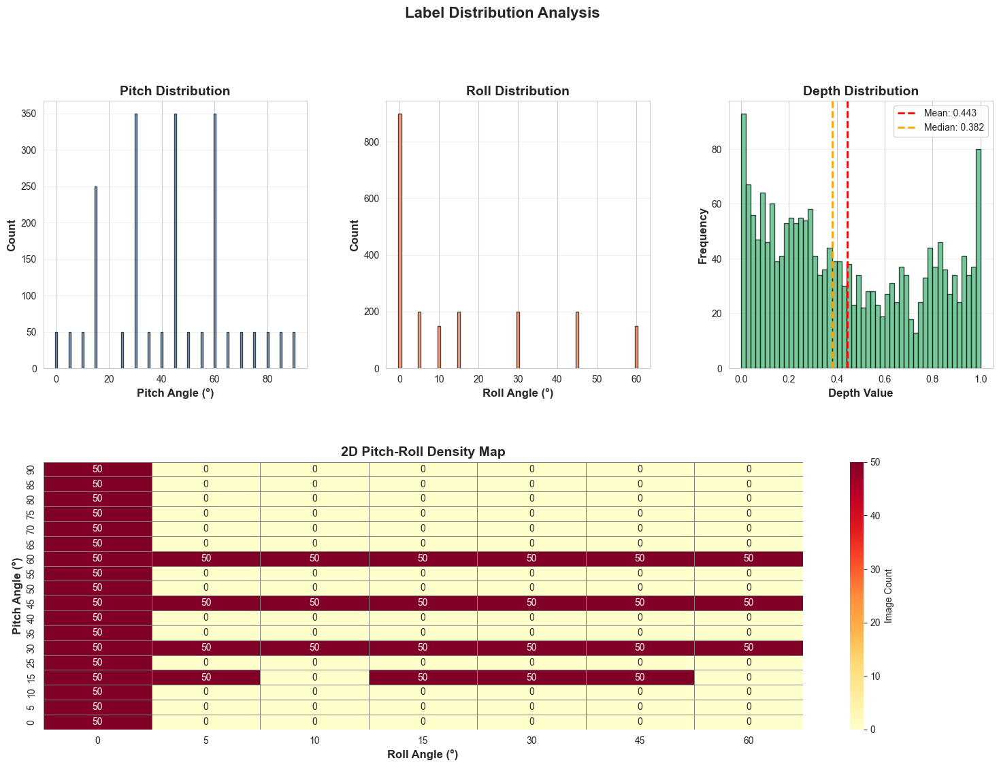

Label distribution plots saved to reports/label_distributions.png


In [4]:
fig = plt.figure(figsize=(18, 12))
gs = gridspec.GridSpec(
    2, 3, 
    figure=fig, 
    hspace=0.35, 
    wspace=0.3,
)


# 1. Pitch Histogram
ax1 = fig.add_subplot(gs[0, 0])
pitch_counts = df['pitch'].value_counts().sort_index()
ax1.bar(pitch_counts.index, pitch_counts.values, color='steelblue', alpha=0.7, edgecolor='black')
ax1.set_xlabel('Pitch Angle (°)', fontsize=12, fontweight='bold')
ax1.set_ylabel('Count', fontsize=12, fontweight='bold')
ax1.set_title('Pitch Distribution', fontsize=14, fontweight='bold')
ax1.grid(axis='y', alpha=0.3)

# 2. Roll Histogram
ax2 = fig.add_subplot(gs[0, 1])
roll_counts = df['roll'].value_counts().sort_index()
ax2.bar(roll_counts.index, roll_counts.values, color='coral', alpha=0.7, edgecolor='black')
ax2.set_xlabel('Roll Angle (°)', fontsize=12, fontweight='bold')
ax2.set_ylabel('Count', fontsize=12, fontweight='bold')
ax2.set_title('Roll Distribution', fontsize=14, fontweight='bold')
ax2.grid(axis='y', alpha=0.3)

# 3. Depth Histogram
ax3 = fig.add_subplot(gs[0, 2])
ax3.hist(df['depth'], bins=50, color='mediumseagreen', alpha=0.7, edgecolor='black')
ax3.set_xlabel('Depth Value', fontsize=12, fontweight='bold')
ax3.set_ylabel('Frequency', fontsize=12, fontweight='bold')
ax3.set_title('Depth Distribution', fontsize=14, fontweight='bold')
ax3.axvline(df['depth'].mean(), color='red', linestyle='--', linewidth=2, label=f'Mean: {df["depth"].mean():.3f}')
ax3.axvline(df['depth'].median(), color='orange', linestyle='--', linewidth=2, label=f'Median: {df["depth"].median():.3f}')
ax3.legend()
ax3.grid(axis='y', alpha=0.3)

# 4. 2D Pitch-Roll Density Map
ax4 = fig.add_subplot(gs[1, :])
pivot_table = df.groupby(['pitch', 'roll']).size().reset_index(name='count')
pivot = pivot_table.pivot(index='pitch', columns='roll', values='count').fillna(0)

sns.heatmap(pivot, annot=True, fmt='.0f', cmap='YlOrRd', cbar_kws={'label': 'Image Count'}, 
            ax=ax4, linewidths=0.5, linecolor='gray')
ax4.set_xlabel('Roll Angle (°)', fontsize=12, fontweight='bold')
ax4.set_ylabel('Pitch Angle (°)', fontsize=12, fontweight='bold')
ax4.set_title('2D Pitch-Roll Density Map', fontsize=14, fontweight='bold')
ax4.invert_yaxis()

plt.suptitle('Label Distribution Analysis', fontsize=16, fontweight='bold', y=0.995)
plt.savefig(project_root / 'reports' / 'label_distributions.png', dpi=300, bbox_inches='tight')
plt.show()

print("Label distribution plots saved to reports/label_distributions.png")

The histogram shows that pitch angles are sampled regularly (0, 5, 10, 15, 25, 30, … up to 90°), but the distribution of valid pitch–roll combinations is extremely uneven. In practice, only four pitch angles contribute to multi-roll diversity, while the rest contribute only roll=0 examples.

This means:

The classifier will have a much easier time predicting pitch than roll, because pitch is represented widely across the dataset whereas roll has restricted support.

Some pitch values (e.g., 5°, 10°, 25°, 35°…) only display small appearance changes, making them visually ambiguous and harder to differentiate.

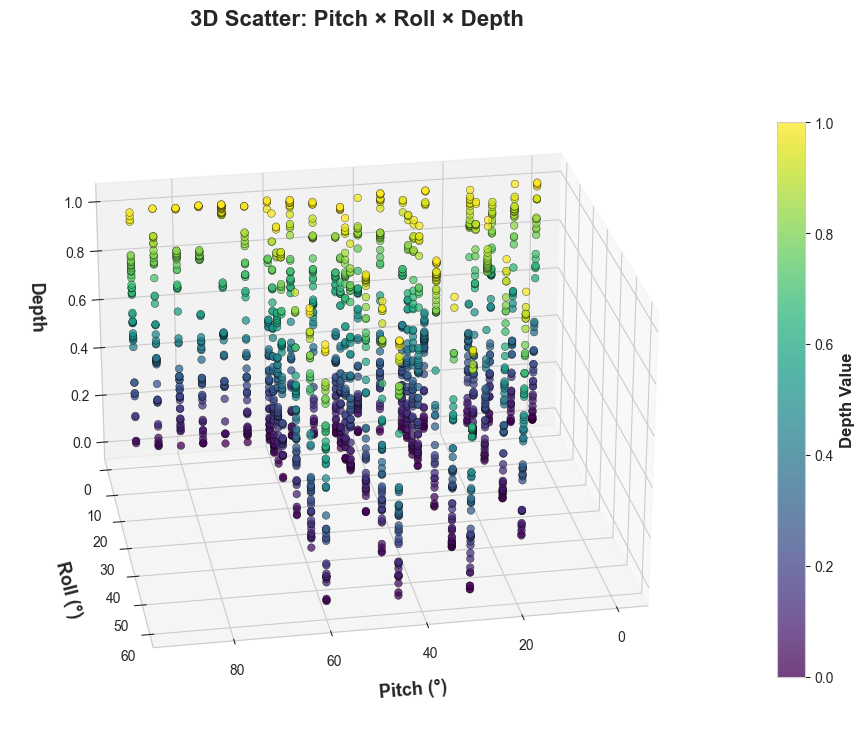

✅ 3D scatter saved to reports/label_distributions_3D.png


In [5]:
fig_3d = plt.figure(figsize=(12, 9))
ax5 = fig_3d.add_subplot(111, projection='3d')

scatter = ax5.scatter(
    df['pitch'], 
    df['roll'], 
    df['depth'], 
    c=df['depth'], 
    cmap='viridis',
    s=30,
    alpha=0.75,
    edgecolors='k',
    linewidth=0.3
)

# Improve 3D aspect ratio (very important)
ax5.set_box_aspect((1.4, 1.2, 0.9))

# Labels & title
ax5.set_xlabel('Pitch (°)', fontsize=13, fontweight='bold', labelpad=12)
ax5.set_ylabel('Roll (°)', fontsize=13, fontweight='bold', labelpad=12)
ax5.set_zlabel('Depth', fontsize=13, fontweight='bold', labelpad=12)
ax5.set_title('3D Scatter: Pitch × Roll × Depth', fontsize=16, fontweight='bold', pad=20)

# Centered, readable colorbar
cbar = fig_3d.colorbar(scatter, ax=ax5, pad=0.08, shrink=0.8, aspect=20)
cbar.set_label('Depth Value', fontsize=12, fontweight='bold')


ax5.view_init(elev=25, azim=80)

# Save separately
plt.savefig(project_root / 'reports' / 'label_distributions_3D.png', dpi=300, bbox_inches='tight')
plt.show()

print("✅ 3D scatter saved to reports/label_distributions_3D.png")


## Part 3: Pose Atlas Visualization

Create a grid of representative images:
- **Rows**: Pitch angles
- **Columns**: Roll angles

This provides intuitive understanding of pose variations.

In [6]:
# Get unique pitch and roll values
unique_pitches = sorted(df['pitch'].unique())
unique_rolls = sorted(df['roll'].unique())

print(f"Creating Pose Atlas: {len(unique_pitches)} pitches × {len(unique_rolls)} rolls")

# Select one representative image per (pitch, roll) combination
atlas_images = {}

for pitch in unique_pitches:
    for roll in unique_rolls:
        subset = df[(df['pitch'] == pitch) & (df['roll'] == roll)]
        if len(subset) > 0:
            # Select image with median depth for consistency
            median_idx = subset['depth'].sub(subset['depth'].median()).abs().idxmin()
            atlas_images[(pitch, roll)] = subset.loc[median_idx, 'image_path']

print(f"Found {len(atlas_images)} pose configurations")

Creating Pose Atlas: 18 pitches × 7 rolls
Found 40 pose configurations


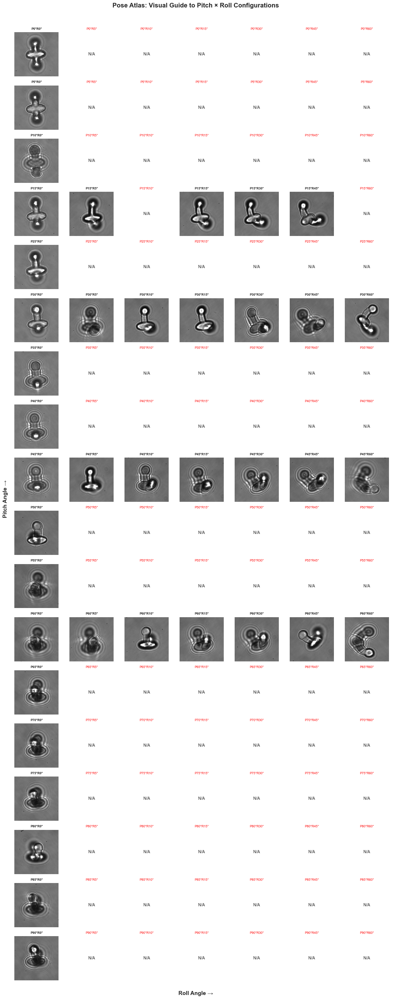

Pose atlas saved to reports/pose_atlas.png


In [7]:
# Create pose atlas grid
n_rows = len(unique_pitches)
n_cols = len(unique_rolls)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols*2, n_rows*2))

for i, pitch in enumerate(unique_pitches):
    for j, roll in enumerate(unique_rolls):
        ax = axes[i, j]
        
        if (pitch, roll) in atlas_images:
            img = Image.open(atlas_images[(pitch, roll)])
            ax.imshow(img, cmap='gray')
            ax.set_title(f'P{pitch}°R{roll}°', fontsize=8, fontweight='bold')
        else:
            ax.text(0.5, 0.5, 'N/A', ha='center', va='center', fontsize=10)
            ax.set_title(f'P{pitch}°R{roll}°', fontsize=8, color='red')
        
        ax.axis('off')

# Add row/column labels
fig.text(0.02, 0.5, 'Pitch Angle →', va='center', rotation='vertical', 
         fontsize=14, fontweight='bold')
fig.text(0.5, 0.02, 'Roll Angle →', ha='center', 
         fontsize=14, fontweight='bold')

plt.suptitle('Pose Atlas: Visual Guide to Pitch × Roll Configurations', 
             fontsize=16, fontweight='bold', y=0.98)
plt.tight_layout(rect=[0.03, 0.03, 1, 0.97])
plt.savefig(project_root / 'reports' / 'pose_atlas.png', dpi=300, bbox_inches='tight')
plt.show()

print("Pose atlas saved to reports/pose_atlas.png")

*Pitch Effects (vertical progression)*

As pitch increases from 0 to ~30°, the microrobot shifts from a flat, symmetric appearance to one where one side becomes foreshortened.

At high pitch angles (e.g., 70°–90°), the microrobot resembles a nearly vertical structure with much less visible top/bottom differentiation, causing visual ambiguity

*Roll Effects (horizontal progression)*

Only visible at P15, P30, P45, P60.

Roll primarily rotates the “arms + spheres” structure around the optical axis.

At mid pitch (30°, 45°), roll introduces large separable appearance shifts; at low pitch (15°) and high pitch (60°), the added differentiation becomes less pronounced.

## Part 4: Pose Manifold Visualization
**Goal:** Show that poses form a smooth manifold in image space.

We'll extract image features and apply:
- **PCA**: Linear dimensionality reduction
- **t-SNE**: Non-linear manifold learning
- **UMAP**: Topology-preserving embedding

In [8]:
def extract_image_features(img_path, target_size=(256, 256)):
    """
    Extract flattened pixel features from image
    For efficiency, we resize images to a smaller size
    """
    img = Image.open(img_path).convert('L')  # Grayscale
    img = img.resize(target_size)
    return np.array(img).flatten()

# Extract features
features = []
for idx, row in df.iterrows():
    features.append(extract_image_features(row['image_path']))

X = np.array(features)
print(f"Extracted features: {X.shape}")

# Normalize features
X = (X - X.mean(axis=0)) / (X.std(axis=0) + 1e-8)

Extracted features: (2000, 65536)


In [9]:
# PCA
print("  - PCA (2D & 3D)")
pca_2d = PCA(n_components=2, random_state=42)
pca_3d = PCA(n_components=3, random_state=42)
X_pca_2d = pca_2d.fit_transform(X)
X_pca_3d = pca_3d.fit_transform(X)

print(f"    PCA 2D explained variance: {pca_2d.explained_variance_ratio_.sum():.3f}")
print(f"    PCA 3D explained variance: {pca_3d.explained_variance_ratio_.sum():.3f}")

# t-SNE
print("  - t-SNE (2D & 3D)")
tsne_2d = TSNE(n_components=2, random_state=42, perplexity=30)
tsne_3d = TSNE(n_components=3, random_state=42, perplexity=30)
X_tsne_2d = tsne_2d.fit_transform(X)
X_tsne_3d = tsne_3d.fit_transform(X)


print("  - UMAP (2D & 3D)")
umap_2d = umap.UMAP(n_components=2, random_state=42)
umap_3d = umap.UMAP(n_components=3, random_state=42)
X_umap_2d = umap_2d.fit_transform(X)
X_umap_3d = umap_3d.fit_transform(X)


  - PCA (2D & 3D)
    PCA 2D explained variance: 0.312
    PCA 3D explained variance: 0.340
  - t-SNE (2D & 3D)
  - UMAP (2D & 3D)


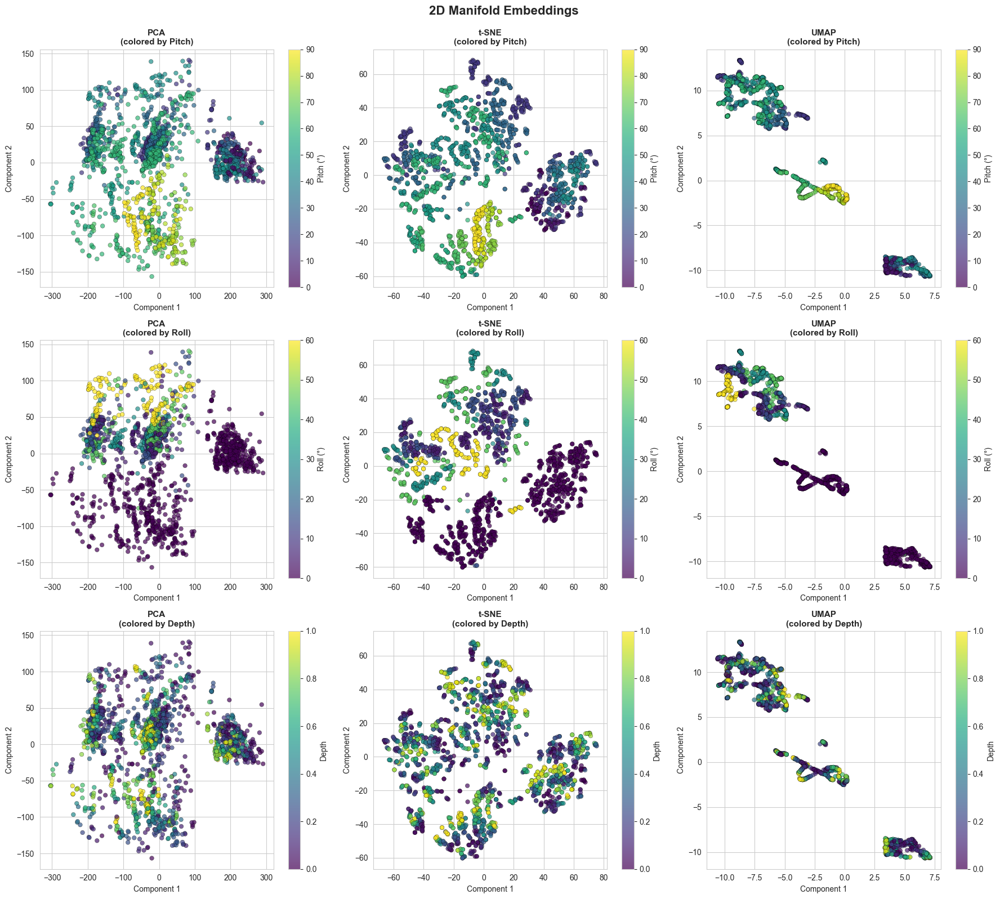

2D manifold plots saved to reports/manifold_2d.png


In [10]:
# Visualization: 2D embeddings colored by Pitch, Roll, Depth
def plot_2d_embeddings(X_emb, labels, label_name, title, ax):
    scatter = ax.scatter(X_emb[:, 0], X_emb[:, 1], c=labels, cmap='viridis', 
                        s=30, alpha=0.7, edgecolors='k', linewidth=0.3)
    ax.set_title(f"{title}\n(colored by {label_name})", fontsize=11, fontweight='bold')
    ax.set_xlabel('Component 1', fontsize=10)
    ax.set_ylabel('Component 2', fontsize=10)
    return scatter

# Create 2D embedding plots
embeddings_2d = [
    ('PCA', X_pca_2d),
    ('t-SNE', X_tsne_2d),
]
if X_umap_2d is not None:
    embeddings_2d.append(('UMAP', X_umap_2d))

fig, axes = plt.subplots(3, len(embeddings_2d), figsize=(6*len(embeddings_2d), 16))

for col, (method, X_emb) in enumerate(embeddings_2d):
    # Colored by Pitch
    scatter1 = plot_2d_embeddings(X_emb, df['pitch'], 'Pitch', method, axes[0, col])
    plt.colorbar(scatter1, ax=axes[0, col], label='Pitch (°)')
    
    # Colored by Roll
    scatter2 = plot_2d_embeddings(X_emb, df['roll'], 'Roll', method, axes[1, col])
    plt.colorbar(scatter2, ax=axes[1, col], label='Roll (°)')
    
    # Colored by Depth
    scatter3 = plot_2d_embeddings(X_emb, df['depth'], 'Depth', method, axes[2, col])
    plt.colorbar(scatter3, ax=axes[2, col], label='Depth')

plt.suptitle('2D Manifold Embeddings', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(project_root / 'reports' / 'manifold_2d.png', dpi=300, bbox_inches='tight')
plt.show()

print("2D manifold plots saved to reports/manifold_2d.png")

Across the three manifold projections, the data exhibits a clear combination of discrete and continuous structure that reflects the underlying physical pose variability of the system. 

PCA shows broad, overlapping clouds for all three variables, indicating that the dominant sources of variance in pixel space are not linearly aligned with pitch, roll, or depth. Nevertheless, even when restricting the analysis to only two principal components, the emergence of discernable clusters suggests that samples from the same class tend to remain neighbours in a low-dimensional latent space. 

This local neighborhood implies that the intrinsic structure of the data is preserved under dimensionality reduction, which in turn reduces the necessity for large datasets or substantially deep model architectures to achieve meaningful class separation.


Both t-SNE and especially UMAP reveal a much more organized latent geometry: the samples separate into a small number of well-defined global clusters, within which pitch and roll vary smoothly as continuous gradients. This indicates that the data is not arbitrarily distributed but instead lies on a structured low-dimensional manifold.

Pitch displays the most coherent global ordering, while roll shows strong intra-cluster organization but with cluster-dependent distributions, suggesting partial coupling between roll and the underlying configuration regime. Depth, on the other hand, does not shape the global geometry of the embeddings and appears as a locally varying attribute within clusters, reflecting that depth information is encoded at a finer visual level rather than through large-scale geometric changes. 

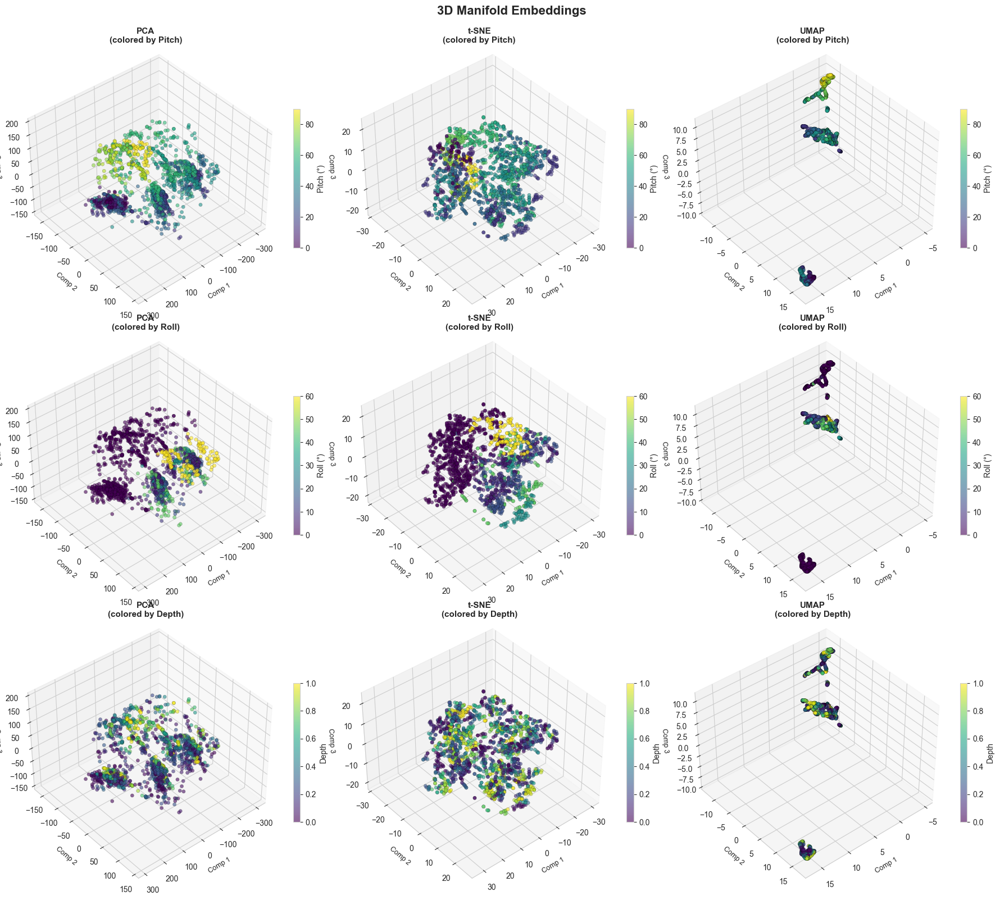

3D manifold plots saved to reports/manifold_3d.png


In [11]:
# Visualization: 3D embeddings
def plot_3d_embeddings(X_emb, labels, label_name, title, ax):
    scatter = ax.scatter(X_emb[:, 0], X_emb[:, 1], X_emb[:, 2], 
                        c=labels, cmap='viridis', s=20, alpha=0.6, 
                        edgecolors='k', linewidth=0.2)
    ax.set_title(f"{title}\n(colored by {label_name})", fontsize=11, fontweight='bold')
    ax.set_xlabel('Comp 1', fontsize=9)
    ax.set_ylabel('Comp 2', fontsize=9)
    ax.set_zlabel('Comp 3', fontsize=9)
    ax.view_init(elev=40, azim=50)
    return scatter

embeddings_3d = [
    ('PCA', X_pca_3d),
    ('t-SNE', X_tsne_3d),
]
if X_umap_3d is not None:
    embeddings_3d.append(('UMAP', X_umap_3d))

fig = plt.figure(figsize=(6*len(embeddings_3d), 16))

for col, (method, X_emb) in enumerate(embeddings_3d):
    # Colored by Pitch
    ax1 = fig.add_subplot(3, len(embeddings_3d), col+1, projection='3d')
    scatter1 = plot_3d_embeddings(X_emb, df['pitch'], 'Pitch', method, ax1)
    plt.colorbar(scatter1, ax=ax1, shrink=0.5, label='Pitch (°)')
    
    # Colored by Roll
    ax2 = fig.add_subplot(3, len(embeddings_3d), len(embeddings_3d)+col+1, projection='3d')
    scatter2 = plot_3d_embeddings(X_emb, df['roll'], 'Roll', method, ax2)
    plt.colorbar(scatter2, ax=ax2, shrink=0.5, label='Roll (°)')
    
    # Colored by Depth
    ax3 = fig.add_subplot(3, len(embeddings_3d), 2*len(embeddings_3d)+col+1, projection='3d')
    scatter3 = plot_3d_embeddings(X_emb, df['depth'], 'Depth', method, ax3)
    plt.colorbar(scatter3, ax=ax3, shrink=0.5, label='Depth')

plt.suptitle('3D Manifold Embeddings', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.savefig(project_root / 'reports' / 'manifold_3d.png', dpi=300, bbox_inches='tight')
plt.show()

print("3D manifold plots saved to reports/manifold_3d.png")

The three-dimensional embeddings reinforce the trends observed in the two-dimensional projections while providing a clearer view of the global geometry of the data. In PCA, the point clouds remain largely overlapping, confirming that increasing dimensionality within a linear framework is still insufficient to fully disentangle pitch, roll, and depth. 

The t-SNE embeddings reveal more compact local groupings, with smoother transitions of pitch and roll across neighboring regions of the space, indicating strong local coherence of pose-related features. 

Most notably, the UMAP representations expose a distinctly stratified structure, with well-separated clusters along one dominant axis and continuous variations within each group, confirming that the data lies on a structured low-dimensional manifold with both discrete and continuous characteristics.

Depth again appears as a locally varying attribute rather than a driver of the global separation.

## Part 5: Sharpness / Focus Analysis

**Hypothesis**: As depth increases away from focal plane, image sharpness decreases.

We compute:
1. **Variance of Laplacian**: Measures focus quality
2. **Sobel Magnitude**: Edge strength indicator

In [12]:
def compute_sharpness_metrics(img_path):

    img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
    
    # Variance of Laplacian
    laplacian = cv2.Laplacian(img, cv2.CV_64F)
    var_laplacian = laplacian.var()
    
    # Sobel magnitude
    sobel_x = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
    sobel_y = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
    sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
    mean_sobel = sobel_magnitude.mean()
    
    return var_laplacian, mean_sobel

# Sample for efficiency
sharpness_sample = df.copy()

laplacian_vals = []
sobel_vals = []

for idx, row in sharpness_sample.iterrows():
    var_lap, mean_sob = compute_sharpness_metrics(row['image_path'])
    laplacian_vals.append(var_lap)
    sobel_vals.append(mean_sob)

sharpness_sample['laplacian_var'] = laplacian_vals
sharpness_sample['sobel_mean'] = sobel_vals

print("Sharpness metrics computed")

Sharpness metrics computed


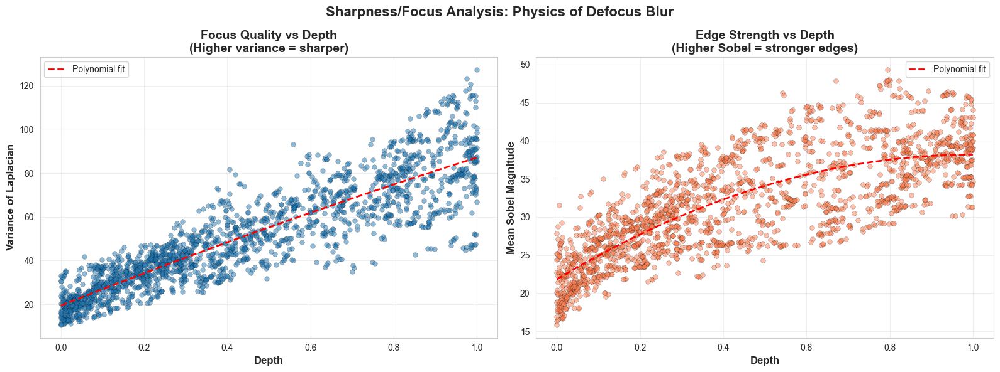

Sharpness analysis saved to reports/sharpness_analysis.png


In [13]:
# Plot sharpness vs depth
fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# Laplacian variance vs Depth
axes[0].scatter(sharpness_sample['depth'], sharpness_sample['laplacian_var'], 
                alpha=0.5, s=30, edgecolors='k', linewidth=0.3)
axes[0].set_xlabel('Depth', fontsize=12, fontweight='bold')
axes[0].set_ylabel('Variance of Laplacian', fontsize=12, fontweight='bold')
axes[0].set_title('Focus Quality vs Depth\n(Higher variance = sharper)', fontsize=14, fontweight='bold')
axes[0].grid(alpha=0.3)

# Add trend line
z = np.polyfit(sharpness_sample['depth'], sharpness_sample['laplacian_var'], 2)
p = np.poly1d(z)
depth_sorted = np.sort(sharpness_sample['depth'])
axes[0].plot(depth_sorted, p(depth_sorted), "r--", linewidth=2, label='Polynomial fit')
axes[0].legend()

# Sobel magnitude vs Depth
axes[1].scatter(sharpness_sample['depth'], sharpness_sample['sobel_mean'], 
                alpha=0.5, s=30, color='coral', edgecolors='k', linewidth=0.3)
axes[1].set_xlabel('Depth', fontsize=12, fontweight='bold')
axes[1].set_ylabel('Mean Sobel Magnitude', fontsize=12, fontweight='bold')
axes[1].set_title('Edge Strength vs Depth\n(Higher Sobel = stronger edges)', fontsize=14, fontweight='bold')
axes[1].grid(alpha=0.3)

# Add trend line
z2 = np.polyfit(sharpness_sample['depth'], sharpness_sample['sobel_mean'], 2)
p2 = np.poly1d(z2)
axes[1].plot(depth_sorted, p2(depth_sorted), "r--", linewidth=2, label='Polynomial fit')
axes[1].legend()

plt.suptitle('Sharpness/Focus Analysis: Physics of Defocus Blur', fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(project_root / 'reports' / 'sharpness_analysis.png', dpi=300, bbox_inches='tight')
plt.show()

print("Sharpness analysis saved to reports/sharpness_analysis.png")

The sharpness–depth analysis reveals a clear and physically consistent relationship between focus quality and axial distance. Both the variance of the Laplacian and the mean Sobel magnitude increase monotonically with depth, indicating that images become progressively sharper and exhibit stronger edge responses as depth grows. 

At low depth values, the measurements are tightly clustered at lower sharpness and edge strength levels, consistent with defocus blur dominating the visual appearance. As depth increases, dispersion widens, suggesting greater heterogeneity in local texture and edge content while maintaining a strong global trend. 

The smooth polynomial fits confirm that this relationship is systematic rather than noise-driven, supporting the interpretation that depth in the dataset is intrinsically encoded through optical sharpness and edge contrast rather than purely geometric cues.

In [14]:
# Statistical analysis
from scipy.stats import pearsonr, spearmanr

pearson_lap, p_lap = pearsonr(sharpness_sample['depth'], sharpness_sample['laplacian_var'])
spearman_lap, sp_lap = spearmanr(sharpness_sample['depth'], sharpness_sample['laplacian_var'])

pearson_sob, p_sob = pearsonr(sharpness_sample['depth'], sharpness_sample['sobel_mean'])
spearman_sob, sp_sob = spearmanr(sharpness_sample['depth'], sharpness_sample['sobel_mean'])

print("\nCorrelation Analysis: Depth vs Sharpness")
print("="*40)
print(f"Laplacian Variance:")
print(f"  Pearson r = {pearson_lap:.4f} (p = {p_lap:.4e})")
print(f"  Spearman ρ = {spearman_lap:.4f} (p = {sp_lap:.4e})")
print(f"\nSobel Magnitude:")
print(f"  Pearson r = {pearson_sob:.4f} (p = {p_sob:.4e})")
print(f"  Spearman ρ = {spearman_sob:.4f} (p = {sp_sob:.4e})")


Correlation Analysis: Depth vs Sharpness
Laplacian Variance:
  Pearson r = 0.8880 (p = 0.0000e+00)
  Spearman ρ = 0.9073 (p = 0.0000e+00)

Sobel Magnitude:
  Pearson r = 0.7642 (p = 0.0000e+00)
  Spearman ρ = 0.7921 (p = 0.0000e+00)


## Part 6: GIF visualization
### Depth-as-Video Visualization

Create animated GIF showing microrobot at different depths for a fixed pose.

Creating depth video for Pitch=0°, Roll=0°
Found 50 frames
GIF saved to /Users/adgodoyo/Library/CloudStorage/OneDrive-UniversidadNacionaldeColombia/Textos y Trabajos/Academic Imperial/Deep Learning/Final Assignment/mycode/reports/depth_video_P0_R0.gif


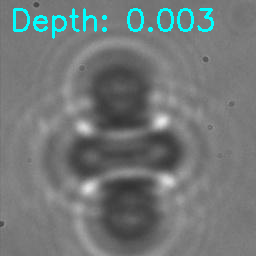

In [15]:
# Select a representative pose configuration (e.g., P0_R0)
target_pitch = 0
target_roll = 0

depth_series = df[(df['pitch'] == target_pitch) & (df['roll'] == target_roll)].copy()
depth_series = depth_series.sort_values('depth').reset_index(drop=True)

print(f"Creating depth video for Pitch={target_pitch}°, Roll={target_roll}°")
print(f"Found {len(depth_series)} frames")


# Create GIF
frames = []

for idx, row in depth_series.iterrows():
    img = Image.open(row['image_path']).convert('RGB')
    
    # Remove EXIF data (including orientation tag)
    # Eliminar datos EXIF (incluyendo la etiqueta de orientación)
    data = list(img.getdata())
    img_no_exif = Image.new(img.mode, img.size)
    img_no_exif.putdata(data)
    
    # Add depth annotation
    # Agregar anotación de profundidad
    img_array = np.array(img_no_exif)
    
    # Convert to OpenCV format to add text
    img_cv = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR)
    cv2.putText(img_cv, f"Depth: {row['depth']:.3f}", (10, 30), 
                cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 255, 0), 2)
    img_cv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
    
    frames.append(img_cv)

# Save as GIF
gif_path = project_root / 'reports' / f'depth_video_P{target_pitch}_R{target_roll}.gif'
imageio.mimsave(gif_path, frames, duration=0.2, loop=0)

print(f"GIF saved to {gif_path}")

# Display in notebook
display(IPImage(filename=str(gif_path)))

### Pitch-Roll-as-Video Visualisation

**Animation sequence:**
1. Progress through pitch: 0° → 15°
2. At 15°: Rotate roll 0° → max → 0° (forth and back)
3. Continue pitch: 15° → 30°
4. At 30°: Rotate roll 0° → max → 0°
5. Continue pitch: 30° → 45°
6. At 45°: Rotate roll 0° → max → 0°
7. Continue pitch: 45° → 60°
8. At 60°: Rotate roll 0° → max → 0°
9. Continue pitch: 60° → max

In [16]:
# Configuration
ROLL_ANIMATION_PITCHES = [15, 30, 45, 60]  # Pitch values where roll animation occurs
PITCH_STEP = 5  # Step size for pitch progression
MEDIAN_DEPTH_TOLERANCE = 0.05  # Tolerance for selecting median depth images

# Get available pitch and roll values
available_pitches = sorted(df['pitch'].unique())
available_rolls = sorted(df['roll'].unique())

print(f"Available pitch values: {available_pitches}")
print(f"Available roll values: {available_rolls}")
print(f"Roll animation will occur at pitches: {ROLL_ANIMATION_PITCHES}")

Available pitch values: [np.int64(0), np.int64(5), np.int64(10), np.int64(15), np.int64(25), np.int64(30), np.int64(35), np.int64(40), np.int64(45), np.int64(50), np.int64(55), np.int64(60), np.int64(65), np.int64(70), np.int64(75), np.int64(80), np.int64(85), np.int64(90)]
Available roll values: [np.int64(0), np.int64(5), np.int64(10), np.int64(15), np.int64(30), np.int64(45), np.int64(60)]
Roll animation will occur at pitches: [15, 30, 45, 60]


In [17]:
def get_representative_image(df, pitch, roll):
    """
    Get a representative image for a given (pitch, roll) combination.
    Selects image with median depth for consistency.
    """
    subset = df[(df['pitch'] == pitch) & (df['roll'] == roll)]
    
    if len(subset) == 0:
        return None
    
    # Select image with median depth
    median_idx = subset['depth'].sub(subset['depth'].median()).abs().idxmin()
    return subset.loc[median_idx, 'image_path']


def add_annotation(img_array, pitch, roll, annotation_type="normal"):
    """
    Add text annotation to image.
    annotation_type: 'normal', 'roll_start', 'roll_end'
    """
    img_cv = cv2.cvtColor(img_array, cv2.COLOR_RGB2BGR)
    
    # Text configuration
    font = cv2.FONT_HERSHEY_SIMPLEX
    font_scale = 0.8
    thickness = 1
    
    # Main text
    text = f"Pitch: {pitch}  Roll: {roll}"
    text_size = cv2.getTextSize(text, font, font_scale, thickness)[0]
    
    # Position at top-left with padding
    x = 15
    y = 40
    
    # Add semi-transparent background for text
    overlay = img_cv.copy()
    cv2.rectangle(overlay, (x-10, y-35), (x + text_size[0] + 10, y + 10), 
                 (0, 0, 0), -1)
    img_cv = cv2.addWeighted(overlay, 0.6, img_cv, 0.4, 0)
    
    # Add text
    cv2.putText(img_cv, text, (x, y), font, font_scale, (0, 255, 255), thickness)
    
    
    return cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)

In [18]:
frames = []
frame_info = []  # For debugging


# Start from minimum pitch
current_pitch = min(available_pitches)
max_pitch = max(available_pitches)

while current_pitch <= max_pitch:
    # Check if we need to do roll animation at this pitch
    if current_pitch in ROLL_ANIMATION_PITCHES:
        
        # Forward roll animation: 0 -> max
        for roll in available_rolls:
            img_path = get_representative_image(df, current_pitch, roll)
            if img_path:
                img = Image.open(img_path).convert('RGB')
                img_array = np.array(img)
                
                annotation_type = "roll_start" if roll == available_rolls[0] else "normal"
                annotated = add_annotation(img_array, current_pitch, roll, annotation_type)
                
                frames.append(annotated)
                frame_info.append(f"P{current_pitch}_R{roll}_forward")
        
        # Backward roll animation: max -> 0 (excluding endpoints to avoid duplication)
        for roll in reversed(available_rolls[:-1]):
            img_path = get_representative_image(df, current_pitch, roll)
            if img_path:
                img = Image.open(img_path).convert('RGB')
                img_array = np.array(img)
                
                annotation_type = "roll_end" if roll == 0 else "normal"
                annotated = add_annotation(img_array, current_pitch, roll, annotation_type)
                
                frames.append(annotated)
                frame_info.append(f"P{current_pitch}_R{roll}_backward")
    
    else:
        # Normal pitch progression (roll = 0)
        roll = 0
        img_path = get_representative_image(df, current_pitch, roll)
        
        if img_path:
            img = Image.open(img_path).convert('RGB')
            img_array = np.array(img)
            annotated = add_annotation(img_array, current_pitch, roll)
            
            frames.append(annotated)
            frame_info.append(f"P{current_pitch}_R{roll}")

    
    # Move to next available pitch
    next_pitches = [p for p in available_pitches if p > current_pitch]
    if not next_pitches:
        break
    current_pitch = next_pitches[0]

print(f"Total frames created: {len(frames)}")

Total frames created: 63


GIF saved to: /Users/adgodoyo/Library/CloudStorage/OneDrive-UniversidadNacionaldeColombia/Textos y Trabajos/Academic Imperial/Deep Learning/Final Assignment/mycode/reports/pitch_roll_rotation_animation.gif


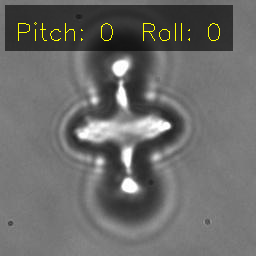

In [19]:
fps = 5  # Frames per second
duration = 1.0 / fps  # Duration per frame in seconds

# Add pause at the end
pause_frames = 30  # Pause for 3 seconds at end
for _ in range(pause_frames):
    frames.append(frames[-1])

# Save GIF
gif_path = project_root / 'reports' / 'pitch_roll_rotation_animation.gif'

imageio.mimsave(gif_path, frames, duration=duration, loop=0)

print(f"GIF saved to: {gif_path}")
display(IPImage(filename=str(gif_path)))